<a href="https://colab.research.google.com/github/romeroc223/SySistemas2025/blob/main/Ejercicios_TransformadaZ_FiltrosDigitales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Ejercicios

1. Descargue 10 segundos de la canción de su preferencia desde youtube, y generé un filtro pasabanda (el usuario debe poder definir las frecuencias de corte) para cada uno de los filtros descritos (el usuario también debe poder fijar los parámetros de diseño de cada filtro). Compare los resultados de los filtros estudiados en este cuaderno tipo IIR para diseño Butterworth, Chebyshev 1, Chebyshev 2, Bessel y Elíptico.

2. Consulte en qué consiste el método de diseño de filtros FIR por ventaneo (Ver función [firwin](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.firwin.html) y [material de apoyo](https://www.programcreek.com/python/example/100540/scipy.signal.firwin)). Realice un cuadro comparativo de las ventajas y desventajas de los filtros IIR y los FIR. Nota: Recuerde que un filtro FIR utiliza solamente raíces tipo ceros, es decir que $a_0=1$, y $a_k=0$ $\forall k\in\{1,2,\dots\}$.

3. Incluya la implementación del filtro `firwin` en el punto 1.

In [5]:
print("Instalando yt-dlp...")
!pip install yt-dlp
print("yt-dlp instalado correctamente.")

Instalando yt-dlp...
yt-dlp instalado correctamente.


In [6]:
# 1. Importación para la lectura del archivo
import soundfile as sf
import os

# 2. Enlace de YouTube para el audio.
link="https://youtu.be/YHRvDo8rUoQ?si=fmFDBub0Nav4KlOf"
nombre_mp3 = "audio3.mp3"
nombre_out = "output3.wav"

# 3. Descargar el audio como MP3
# Se añade la opción -f bestaudio para asegurar la mejor calidad de audio.
print(f"Descargando audio de: {link}...")
!yt-dlp -f bestaudio --extract-audio -o {nombre_mp3} --audio-format mp3 {link}

# 4. Convertir MP3 a WAV (formato preferido para procesamiento en Python)
# Se añade -y para sobrescribir si el archivo ya existe.
print(f"Convirtiendo {nombre_mp3} a {nombre_out}...")
!ffmpeg -i {nombre_mp3} -y {nombre_out}

# 5. Cargar el archivo WAV y obtener la señal (x) y la frecuencia de muestreo (fs)
if os.path.exists(nombre_out):
    x, fs = sf.read(nombre_out)
    print(f"\n✅ Archivo cargado correctamente.")
    print(f"Frecuencia de muestreo (fs): {fs} Hz")
    print(f"Dimensiones de la señal (x): {x.shape}")
else:
    print(f"\n❌ Error: El archivo {nombre_out} no se pudo crear. Revise la instalación de yt-dlp y ffmpeg.")

# Nota: Las variables x y fs están ahora disponibles para el siguiente bloque.

Descargando audio de: https://youtu.be/YHRvDo8rUoQ?si=fmFDBub0Nav4KlOf...
[youtube] Extracting URL: https://youtu.be/YHRvDo8rUoQ?si=fmFDBub0Nav4KlOf
[youtube] YHRvDo8rUoQ: Downloading webpage
[youtube] YHRvDo8rUoQ: Downloading android sdkless player API JSON
[youtube] YHRvDo8rUoQ: Downloading web safari player API JSON
[youtube] YHRvDo8rUoQ: Downloading m3u8 information
[info] YHRvDo8rUoQ: Downloading 1 format(s): 251
[download] audio3.mp3 has already been downloaded
[ExtractAudio] Not converting audio audio3.mp3; file is already in target format mp3
Convirtiendo audio3.mp3 a output3.wav...
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --e

Frecuencia de muestreo: 48000 Hz
Longitud de la señal mono para filtrado: 10.00 segundos.


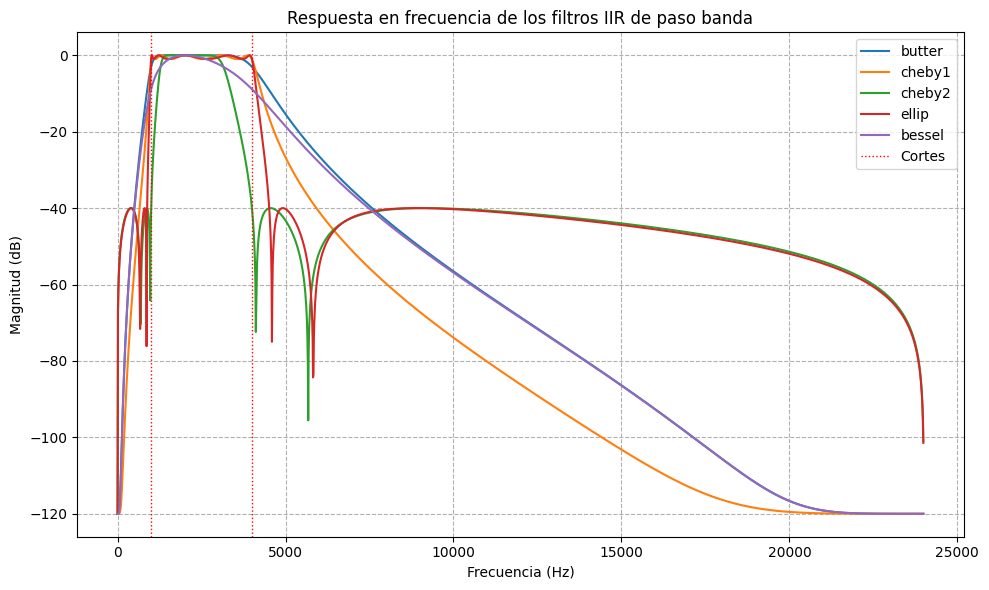

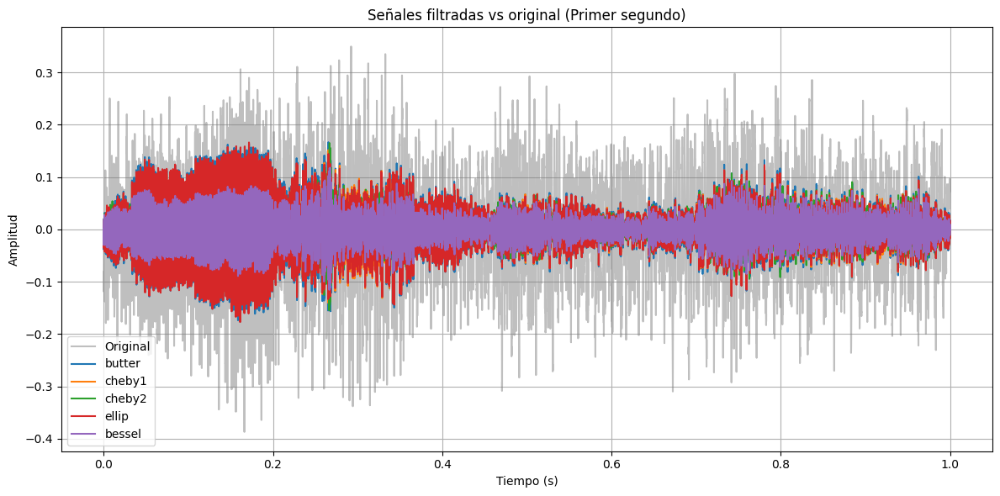

🔊 Audio original (Segmento de 10 segundos):


🔊 Audio filtrado con filtro Butterworth:


🔊 Audio filtrado con filtro Chebyshev Tipo I:


🔊 Audio filtrado con filtro Chebyshev Tipo II:


🔊 Audio filtrado con filtro Elíptico:


🔊 Audio filtrado con filtro Bessel:


In [7]:
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, cheby1, cheby2, ellip, bessel, sosfiltfilt, sosfreqz
from IPython.display import Audio, display
import os

# ⚠️ Verificación de dependencia: Asegurar que x y fs existan, si no, se carga 'output3.wav'.
# Esto es vital si los bloques se ejecutan por separado.
if 'x' not in locals() or 'fs' not in locals():
    nombre_out = "output3.wav"
    if os.path.exists(nombre_out):
        try:
            x, fs = sf.read(nombre_out)
        except NameError:
            print("Error: 'soundfile' no está importado. Ejecute el Bloque 1 primero o importe sf.")
            # Si sf no está importado, asumimos que no se puede continuar.
            # Podríamos reimportar sf aquí si fuese necesario.
        except Exception as e:
            print(f"Error al leer el archivo: {e}")
            exit()
    else:
        print("❌ Error: Ejecute el Bloque 1 para crear 'output3.wav' y definir 'x' y 'fs'.")
        exit()

print(f"Frecuencia de muestreo: {fs} Hz")

# 🔹 Parte 2: Seleccionar 10 segundos de audio y convertir a mono
ti = 30  # segundo inicial
tf = 40  # segundo final (10 segundos)

# Asegurar que el índice final no exceda la longitud de la señal
start_idx = int(ti * fs)
end_idx = int(tf * fs)

# Recortar la señal, asegurándose de que haya datos suficientes
if end_idx > len(x):
    print(f"Advertencia: El audio solo tiene {len(x)/fs:.2f} segundos. Se usa el final disponible.")
    end_idx = len(x)

xs = x[start_idx:end_idx]

# Conversión a mono
if xs.ndim == 2:
    # Si es estéreo, promediar a mono
    xmono = np.mean(xs, axis=1)
else:
    # Si ya es mono (ndim = 1), usar directamente
    xmono = xs

print(f"Longitud de la señal mono para filtrado: {len(xmono)/fs:.2f} segundos.")

# 🔹 Parte 3: Definir parámetros de usuario
orden = 5           # orden del filtro
f_low = 1000        # Hz - frecuencia de corte inferior
f_high = 4000       # Hz - frecuencia de corte superior
ripple = 1          # dB - ripple en banda pasante (cheby1, ellip)
atten = 40          # dB - atenuación en banda de rechazo (cheby2, ellip)

# 🔹 Parte 4: Función para diseñar y aplicar filtros (Sin cambios, es correcta)
def diseñar_filtrar(filtro_tipo, orden, f_low, f_high, fs,
                     ripple=None, atten=None):
    Wn = [f_low, f_high]
    if filtro_tipo == "butter":
        sos = butter(orden, Wn, btype='bandpass', output='sos', fs=fs)
    elif filtro_tipo == "cheby1":
        sos = cheby1(orden, ripple, Wn, btype='bandpass', output='sos', fs=fs)
    elif filtro_tipo == "cheby2":
        sos = cheby2(orden, atten, Wn, btype='bandpass', output='sos', fs=fs)
    elif filtro_tipo == "ellip":
        sos = ellip(orden, ripple, atten, Wn, btype='bandpass', output='sos', fs=fs)
    elif filtro_tipo == "bessel":
        sos = bessel(orden, Wn, btype='bandpass', output='sos', fs=fs, norm='phase')
    else:
        raise ValueError("Filtro no reconocido")

    y = sosfiltfilt(sos, xmono)
    return y, sos

# 🔹 Parte 5: Filtrar con cada tipo y almacenar resultados (Sin cambios, es correcta)
resultados = {}
tipos_filtro = ['butter', 'cheby1', 'cheby2', 'ellip', 'bessel']

for tipo in tipos_filtro:
    y, sos = diseñar_filtrar(tipo, orden, f_low, f_high, fs,
                              ripple=ripple, atten=atten)
    resultados[tipo] = {
        'y': y,
        'sos': sos
    }

# 🔹 Parte 6: Comparar respuesta en frecuencia
plt.figure(figsize=(10, 6))
for tipo, info in resultados.items():
    w, h = sosfreqz(info['sos'], worN=2000, fs=fs)
    plt.plot(w, 20 * np.log10(np.abs(h) + 1e-6), label=tipo)

plt.title("Respuesta en frecuencia de los filtros IIR de paso banda")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud (dB)")
plt.grid(True, which='both', linestyle='--')
plt.axvline(f_low, color='r', linestyle=':', linewidth=1, label='Cortes')
plt.axvline(f_high, color='r', linestyle=':', linewidth=1)
plt.legend()
plt.tight_layout()
plt.show()

# 🔹 Parte 7: Comparar en el tiempo
t = np.arange(len(xmono)) / fs
plt.figure(figsize=(12, 6))
# Se muestra el primer segundo para visualizar la diferencia
segmento_visual = min(len(xmono), int(1 * fs))
plt.plot(t[:segmento_visual], xmono[:segmento_visual], label='Original', color='gray', alpha=0.5)
for tipo in tipos_filtro:
    plt.plot(t[:segmento_visual], resultados[tipo]['y'][:segmento_visual], label=tipo)
plt.title(f"Señales filtradas vs original (Primer segundo)")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 🔹 Parte 8: Reproducir audios filtrados
print("🔊 Audio original (Segmento de 10 segundos):")
display(Audio(xmono, rate=fs))

print("🔊 Audio filtrado con filtro Butterworth:")
display(Audio(resultados['butter']['y'], rate=fs))

print("🔊 Audio filtrado con filtro Chebyshev Tipo I:")
display(Audio(resultados['cheby1']['y'], rate=fs))

print("🔊 Audio filtrado con filtro Chebyshev Tipo II:")
display(Audio(resultados['cheby2']['y'], rate=fs))

print("🔊 Audio filtrado con filtro Elíptico:")
display(Audio(resultados['ellip']['y'], rate=fs))

print("🔊 Audio filtrado con filtro Bessel:")
display(Audio(resultados['bessel']['y'], rate=fs))

#Punto 2

# Diseño de filtros FIR por ventana

## ¿En qué consiste el método de diseño FIR por ventana?

El método por ventana es una técnica utilizada para diseñar filtros **FIR** (Finite Impulse Response) mediante el recorte de una respuesta ideal (infinita) del filtro utilizando una función ventana que la hace finita y realizable.

El procedimiento general consiste en:

1. Calcular la respuesta al impulso **ideal** del filtro deseado (por ejemplo, un filtro pasa bajos ideal).
2. Multiplicar esa respuesta por una **ventana temporal** (como Hamming, Hanning, Blackman, etc.) para reducir el ripple y hacer el filtro realizable.
3. El resultado es un filtro FIR **estable** y con posibles propiedades como **fase lineal**.

En Python, el diseño se realiza fácilmente con la función [`scipy.signal.firwin`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.firwin.html).

## Recordatorio teórico de los filtros FIR

La ecuación de diferencia de un filtro FIR es:

$$
y[n] = \sum_{k=0}^{M} b_k \cdot x[n - k]
$$

Es decir, solo depende de los valores actuales y pasados de la entrada (no hay retroalimentación). Esto significa que:

- $$a_0 = 1$$
- $$a_k = 0 \quad \forall k \in \{1, 2, \dots\}$$

## Comparación Filtros FIR vs IIR

| Característica              | Filtros FIR                        | Filtros IIR                         |
|----------------------------|------------------------------------|-------------------------------------|
| **Estabilidad**            | Siempre estables                   | Pueden ser inestables               |
| **Fase lineal**            | Pueden tener fase perfectamente lineal | Generalmente no lineales            |
| **Eficiencia computacional** | Requieren más coeficientes         | Requieren menos coeficientes        |
| **Diseño**                 | Más sencillo con `firwin` y ventanas | Más complejo (Butterworth, Chebyshev, etc.) |
| **Precisión en frecuencia**| Más ripple o transición ancha      | Alta precisión                      |
| **Realimentación**         | No usan (solo ceros)               | Usan realimentación (ceros y polos) |
| **Uso común**              | Aplicaciones que requieren fase lineal (audio, comunicaciones) | Aplicaciones donde importa más la eficiencia que la fase |

Frecuencia de muestreo: 48000 Hz


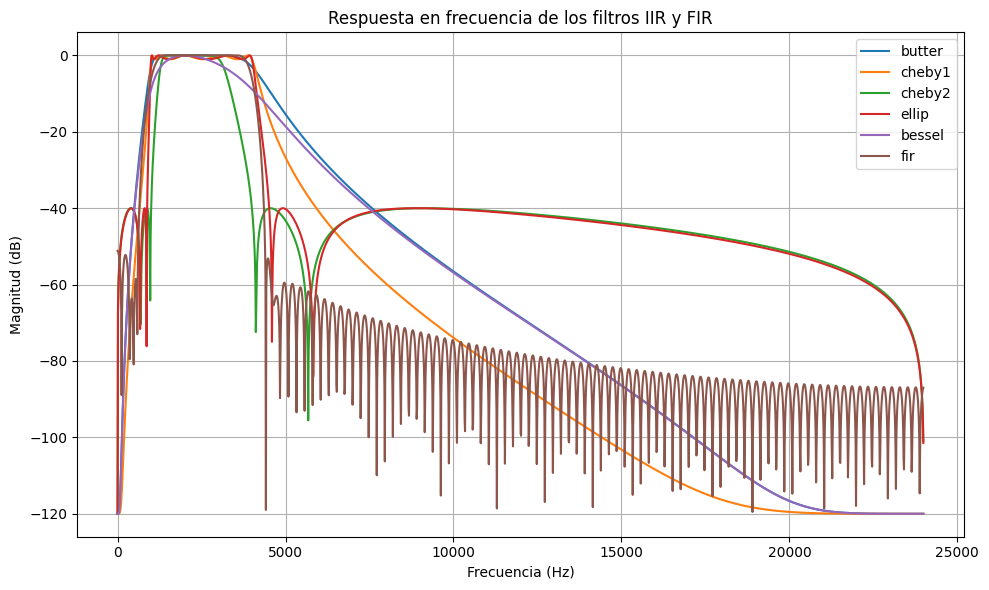

/tmp/ipython-input-300570162.py:71: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


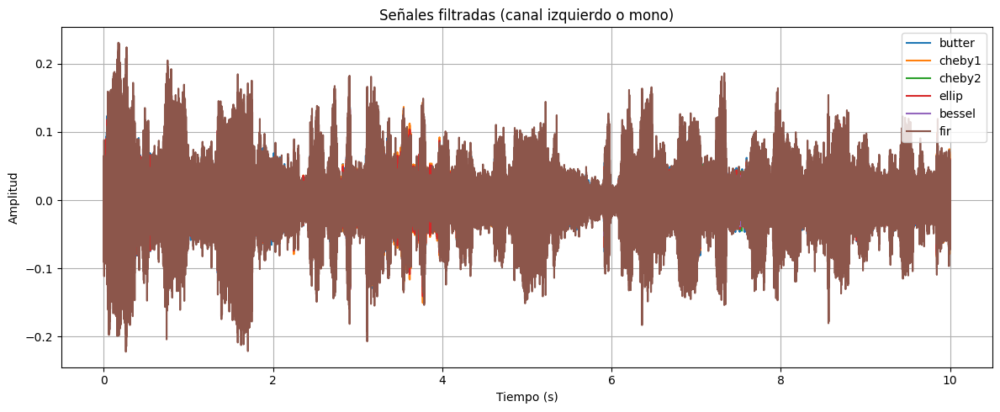

🔊 Audio filtrado con FIR (firwin):


In [8]:
# 🔹 Parte 0: Cargar el audio descargado y convertirlo
import numpy as np
import soundfile as sf
from scipy.signal import firwin, lfilter, freqz, sosfreqz
import matplotlib.pyplot as plt
from IPython.display import Audio, display

# Leer el archivo de audio completo (estéreo)
nombre_out = "output3.wav"
x, fs = sf.read(nombre_out)
print(f"Frecuencia de muestreo: {fs} Hz")

# 🔹 Parte 1: Seleccionar 10 segundos del audio estéreo
ti = 30  # segundo inicial
tf = 40  # segundo final (10 segundos)
xs = x[int(ti * fs):int(tf * fs), :]  # segmento estéreo
t = np.arange(xs.shape[0]) / fs

# 🔹 Parte 2: Parámetros del filtro FIR
numtaps = 201
f_low = 1000  # Hz
f_high = 4000  # Hz

# 🔹 Parte 3: Diseño del filtro FIR por ventana (Hamming)
fir_coef = firwin(numtaps=numtaps, cutoff=[f_low, f_high], pass_zero=False, fs=fs, window='hamming')

# 🔹 Parte 4: Aplicar filtro FIR a ambos canales
yL_fir = lfilter(fir_coef, 1.0, xs[:, 0])
yR_fir = lfilter(fir_coef, 1.0, xs[:, 1])
y_fir_stereo = np.stack((yL_fir, yR_fir), axis=1)

# 🔹 Parte 5: Guardar resultado FIR en estructura 'resultados'
resultados['fir'] = {
    'y': y_fir_stereo,
    'coef': fir_coef
}

# 🔹 Parte 6: Respuesta en frecuencia de todos los filtros (IIR + FIR)
plt.figure(figsize=(10, 6))
for tipo in tipos_filtro:
    w, h = sosfreqz(resultados[tipo]['sos'], worN=2000, fs=fs)
    plt.plot(w, 20 * np.log10(np.abs(h) + 1e-6), label=tipo)

# Agregar FIR
w_fir, h_fir = freqz(resultados['fir']['coef'], worN=2000, fs=fs)
plt.plot(w_fir, 20 * np.log10(np.abs(h_fir) + 1e-6), label='fir')

plt.title("Respuesta en frecuencia de los filtros IIR y FIR")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud (dB)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 🔹 Comparación en el tiempo (canal izquierdo o único canal si es mono)
plt.figure(figsize=(12, 5))

for tipo in tipos_filtro + ['fir']:
    y = resultados[tipo]['y']
    if y.ndim == 1:  # señal mono
        plt.plot(t, y, label=tipo)
    else:  # señal estéreo
        plt.plot(t, y[:, 0], label=tipo)

plt.title("Señales filtradas (canal izquierdo o mono)")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 🔹 Parte 8: Reproducir el audio FIR estéreo
print("🔊 Audio filtrado con FIR (firwin):")
display(Audio(resultados['fir']['y'].T, rate=fs))
